Copyright (c) 2020 Ryan Cohn and Elizabeth Holm. All rights reserved. <br />
Licensed under the MIT License (see LICENSE for details) <br />
Written by Ryan Cohn

# Instance Segmentation of Spheroidite particles in the UltraHigh Carbon Steel Database

In [1]:
## regular module imports
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import pickle
import skimage.io
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.structures import BoxMode

## ampis
ampis_root = Path('../../')
sys.path.append(str(ampis_root))

from ampis import data_utils, visualize

%matplotlib inline

# Loading Data
The process for training models for powder particles and satellites is identical. Enter the corresponding value depending on which model you want to train. The paths to individual images, and all annotation data are stored in the JSON files generated by the VGG image annotator.

In [2]:
EXPERIMENT_NAME = 'spheroidite'
image_root = Path('data','images')
label_root = Path('data','annotations')

assert image_root.is_dir()
assert label_root.is_dir()

## Registration
Detectron2 requires that datasets be registered for later use.
Registration stores the name of the dataset and a function that can be used to retrieve the image paths and labels in a format that the model can use.

In [3]:
DatasetCatalog.clear()  # resets catalog, helps prevent errors from running cells multiple times

# store names of datasets that will be registered for easier access later
dataset_train = f'{EXPERIMENT_NAME}_Train'
dataset_valid = f'{EXPERIMENT_NAME}_Val'

# register the training dataset
DatasetCatalog.register(dataset_train, lambda: data_utils.get_ddicts(label_fmt='binary',  # annotations stored in binary images
                                                                                                     im_root=image_root,  # directory containing images
                                                                                                     ann_root=label_root,  # directory containing annotations
                                                                                                     pattern='*train*',  # glob pattern to select files with 'train' in the filename
                                                                                                     dataset_class='Train'))  # indicates this is training data
# register the validation dataset
DatasetCatalog.register(dataset_valid, lambda: data_utils.get_ddicts(label_fmt='binary',  # annotations stored in binary images
                                                                                                     im_root=image_root,  # directory containing images
                                                                                                     ann_root=label_root,  # directory containing annotations
                                                                                                     pattern='*valid*',  # glob pattern to select files with 'valid' in the filename
                                                                                                     dataset_class='Validation'))  # indicates this is training data
print(f'Registered Datasets: {list(DatasetCatalog._REGISTERED.keys())}')

## There is also a metadata catalog, which stores the class names.
for d in [dataset_train, dataset_valid]:
    MetadataCatalog.get(d).set(**{'thing_classes': [EXPERIMENT_NAME]})

Registered Datasets: ['spheroidite_Train', 'spheroidite_Val']


## Verify images and annotations are loaded correctly
Also, this is a great time to admire my hand-drawn labels, which took sooooo long to do!
### Training Data

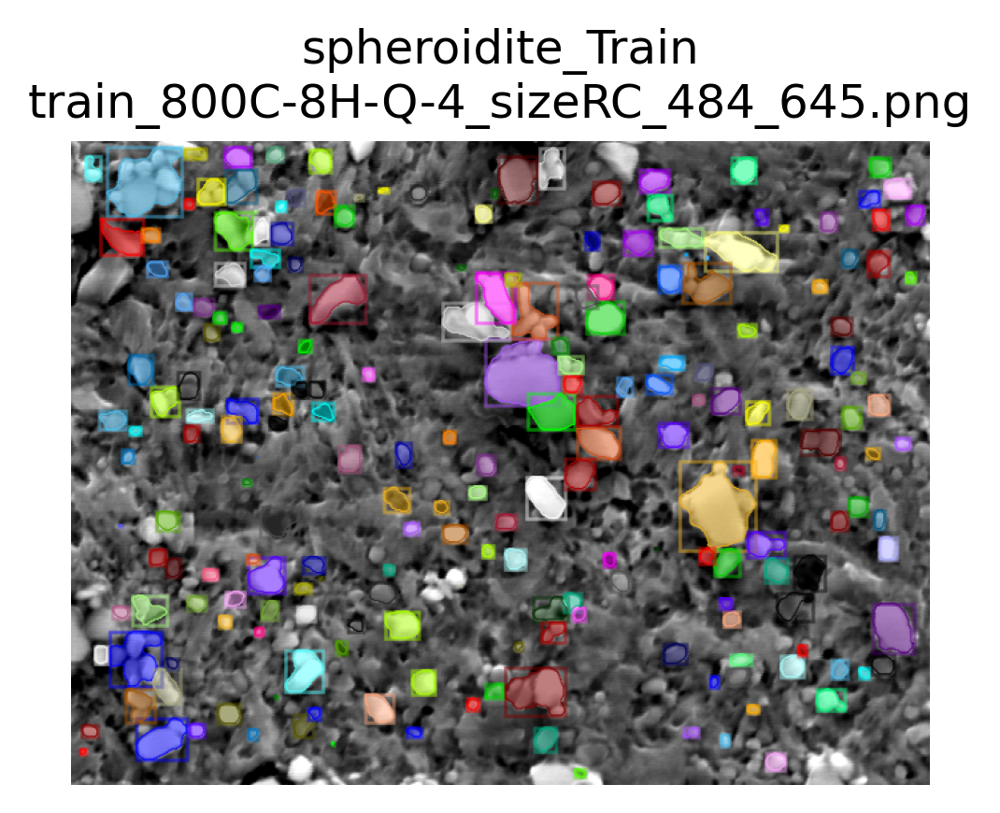

ddict info:
	path: data/images/train_800C-8H-Q-4_sizeRC_484_645.png
	num_instances: 226


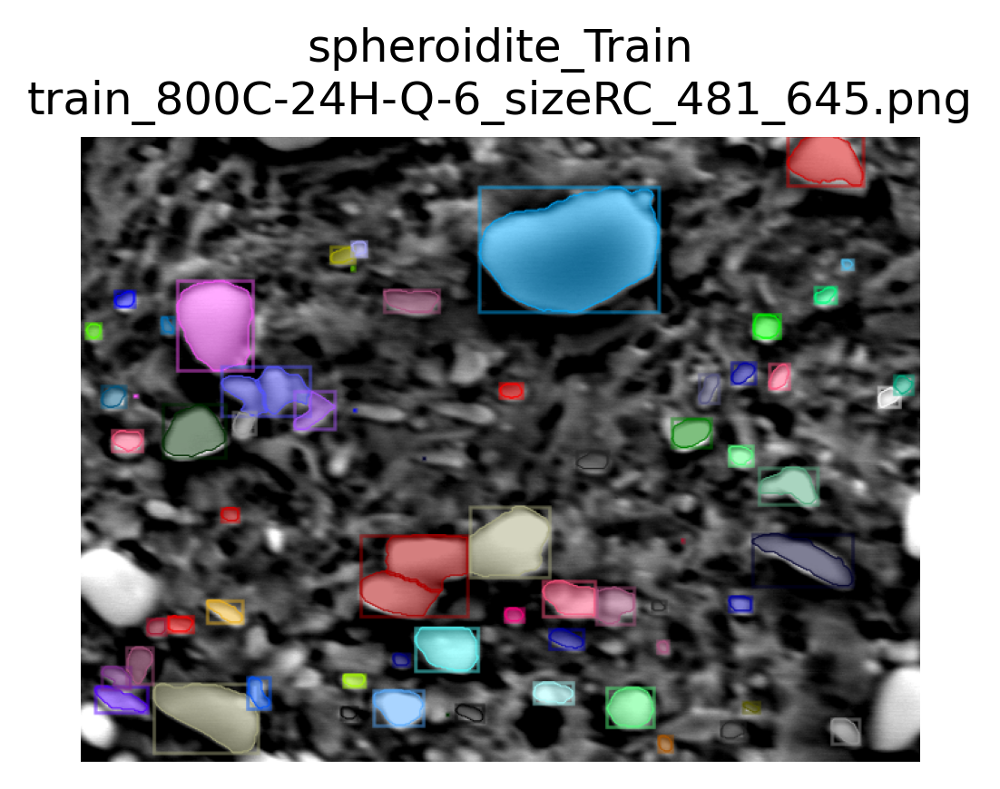

ddict info:
	path: data/images/train_800C-24H-Q-6_sizeRC_481_645.png
	num_instances: 74


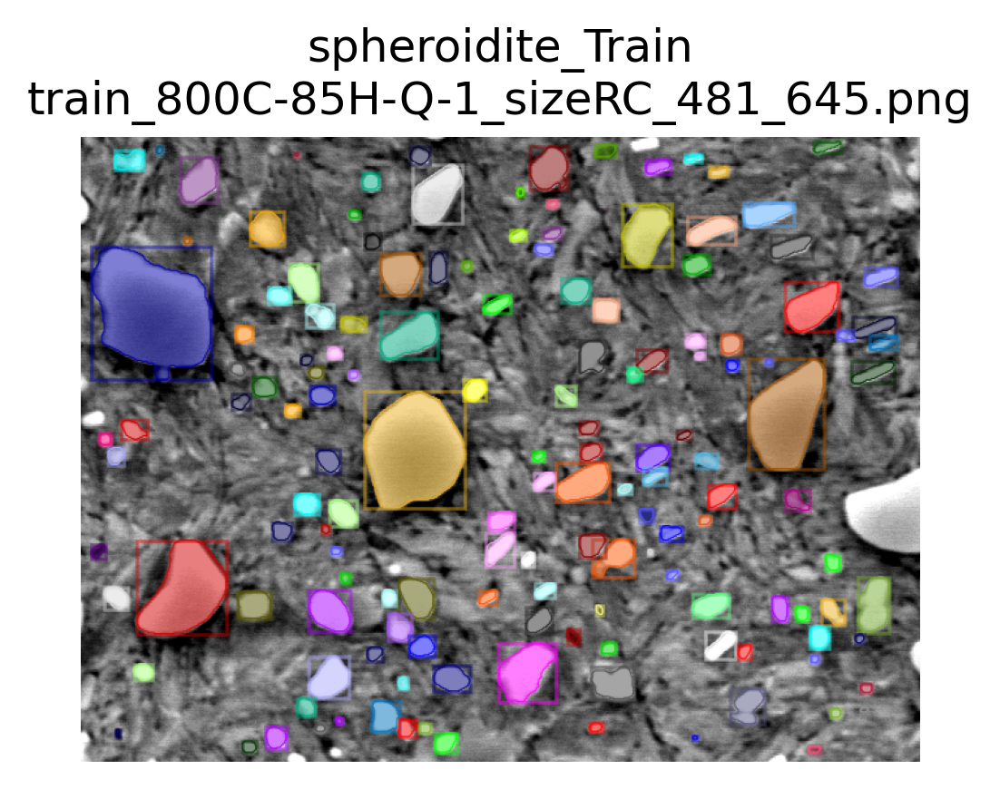

ddict info:
	path: data/images/train_800C-85H-Q-1_sizeRC_481_645.png
	num_instances: 161


In [4]:
for i in np.random.choice(DatasetCatalog.get(dataset_train), 3, replace=False):
    visualize.display_ddicts(i, None, dataset_train, suppress_labels=True)

### Validation Data

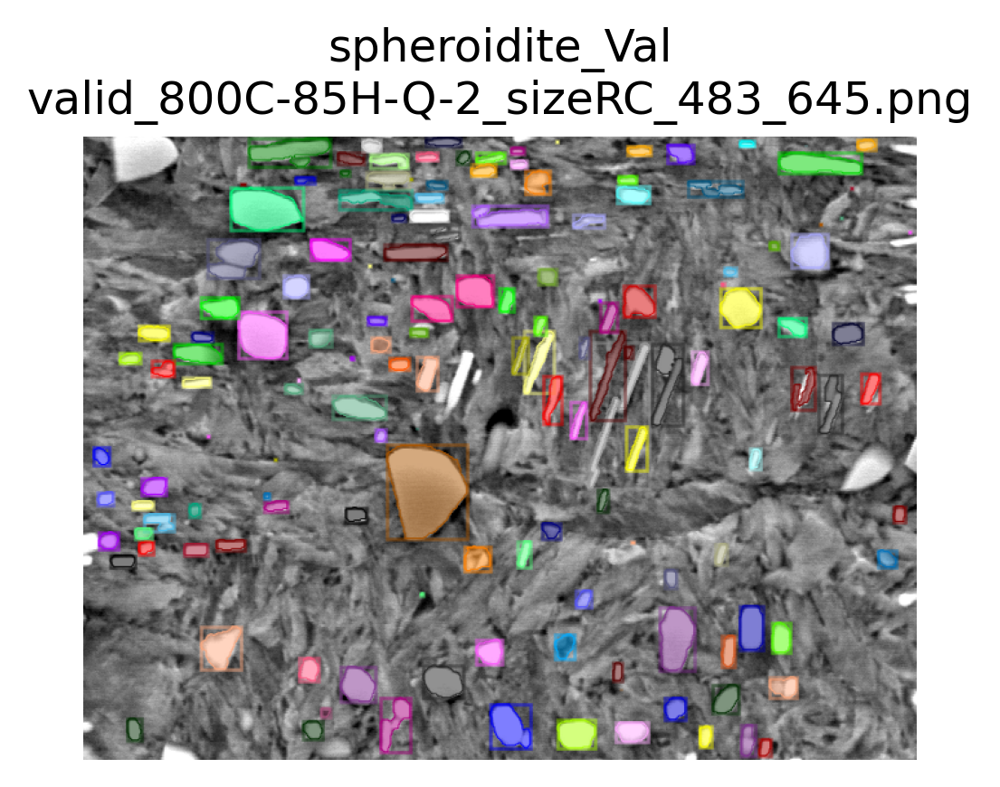

ddict info:
	path: data/images/valid_800C-85H-Q-2_sizeRC_483_645.png
	num_instances: 154


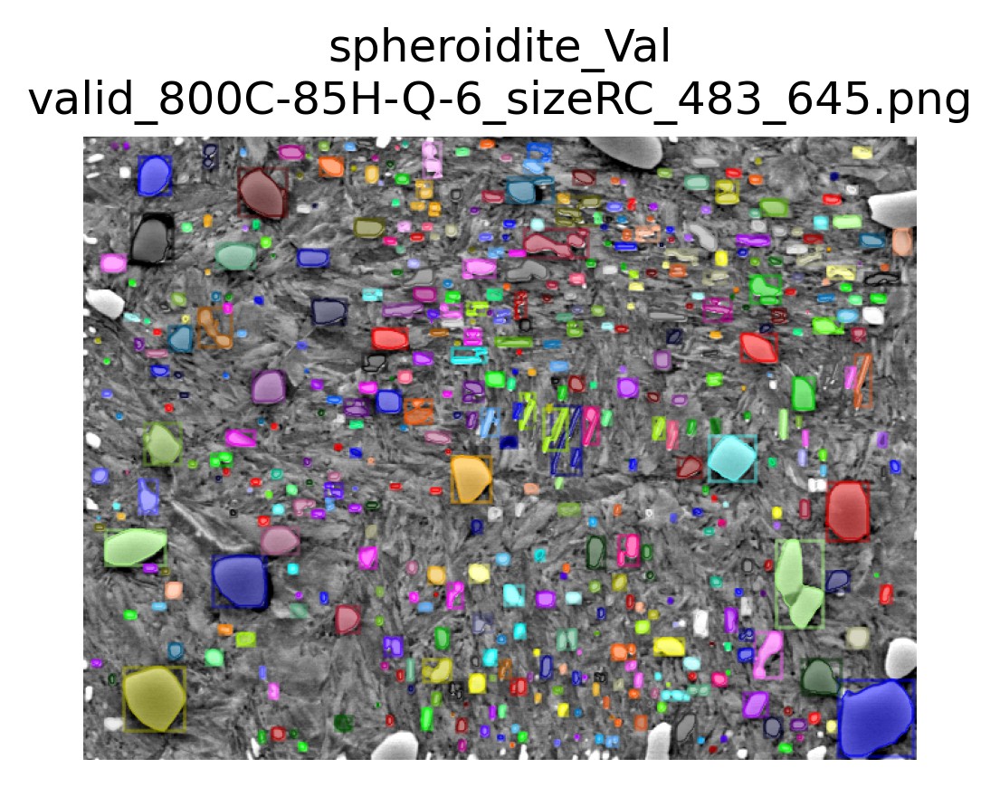

ddict info:
	path: data/images/valid_800C-85H-Q-6_sizeRC_483_645.png
	num_instances: 548


In [5]:
for i in DatasetCatalog.get(dataset_valid):
    visualize.display_ddicts(i, None, dataset_valid, suppress_labels=True)

## Model Configuration
This is where we specify the directory where the outputs are saved, various hyperparameters for the model, and more.

In [6]:
cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.INPUT.MASK_FORMAT = 'bitmask'  # masks are stored as RLE-encoded bitmasks
cfg.DATASETS.TRAIN = (dataset_train,)  # dataset used for training model
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # we will look at the predictions on both sets after training
cfg.SOLVER.IMS_PER_BATCH = 1 # number of images per batch (across all machines)
cfg.SOLVER.CHECKPOINT_PERIOD = 400  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cuda'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 150  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
cfg.SOLVER.MAX_ITER = 2000  # maximum number of iterations to run during training
                            # Increasing this may improve the training results, but will take longer to run (especially without a gpu!)

# model weights will be downloaded if they are not present
weights_path = Path('..','..','models','model_final_f10217.pkl')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path(f'{EXPERIMENT_NAME}_output'))
# make the output directory
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)

Using locally stored weights: ../../models/model_final_f10217.pkl


# Model Training
Once we have everything set up, training is very easy!

Note- this block will generate a huge wall of text.

In [11]:
trainer = DefaultTrainer(cfg)  # create trainer object from cfg
trainer.resume_or_load(resume=False)  # start training from iteration 0
trainer.train()  # train the model!

[08/13 10:40:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.
/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.
/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeabl

[08/13 10:40:41 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7f3513da0f70> to CPU due to CUDA OOM
[08/13 10:40:45 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7f3513da0f70> to CPU due to CUDA OOM
[08/13 10:40:51 d2.utils.events]:  eta: 0:10:23  iter: 19  total_loss: 3.154  loss_cls: 0.666  loss_box_reg: 0.120  loss_mask: 0.635  loss_rpn_cls: 0.687  loss_rpn_loc: 0.914  time: 0.7572  data_time: 0.2100  lr: 0.000400  max_mem: 3497M
[08/13 10:40:57 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7f3513da0f70> to CPU due to CUDA OOM
[08/13 10:41:00 d2.utils.events]:  eta: 0:09:29  iter: 39  total_loss: 2.461  loss_cls: 0.449  loss_box_reg: 0.149  loss_mask: 0.482  loss_rpn_cls: 0.601  loss_rpn_loc: 0.742  time: 0.6065  data_time: 0.0944  lr: 0.000799  max_mem: 3497M
[08/13 10:41:03 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7f3513da0f70> to CPU due to CUDA OOM
[08/13 10:41

# Visualizing model predictions
We will view the model predictions on the training and validation set.

In [7]:
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # predictor requires this field to not be empty
cfg.MODEL.WEIGHTS = str(model_checkpoints[-1])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.
predictor = DefaultPredictor(cfg)  # create predictor object

## Generating predictions on new images is simple.
We will load a new image (not included in either dataset) and generate predictions.
Note that we do not have labels for this image and do not need to register it to a dataset.

We will now generate predictions on all of the images in the training and validation sets, and save the results for later.

Dataset: spheroidite_Train
	File: data/images/train_800C-8H-Q-3_sizeRC_483_645.png


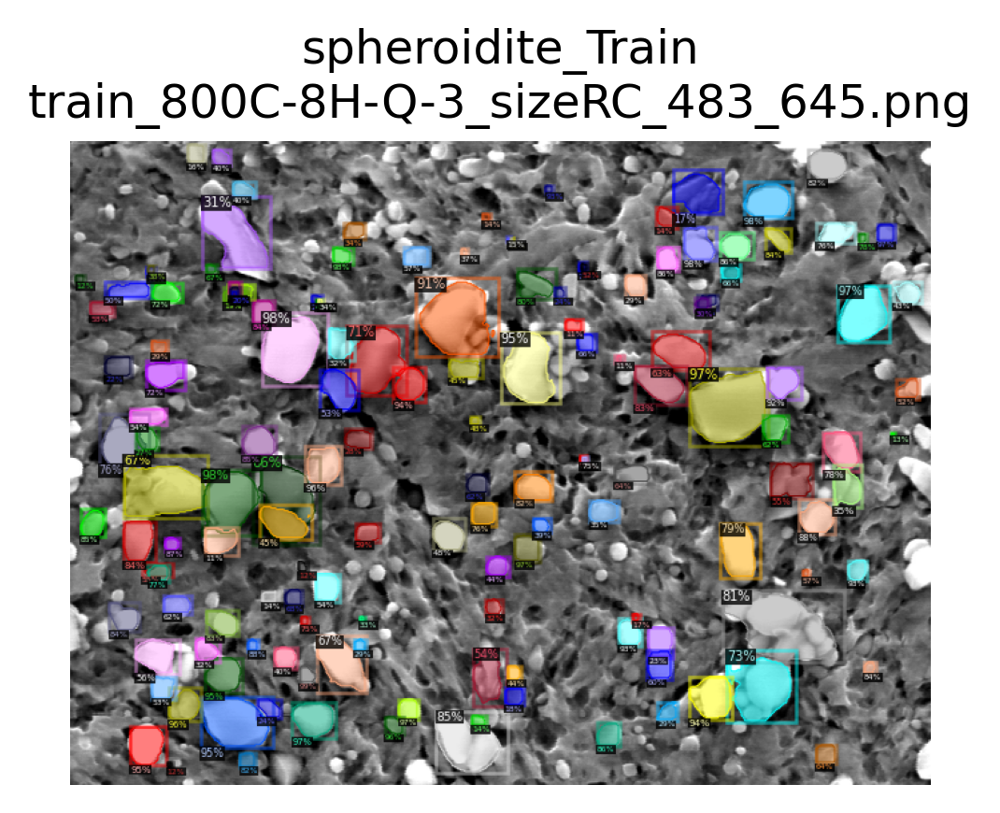

ddict info:
	path: data/images/train_800C-8H-Q-3_sizeRC_483_645.png
	num_instances: 150
	File: data/images/train_800C-24H-Q-4_sizeRC_481_645.png


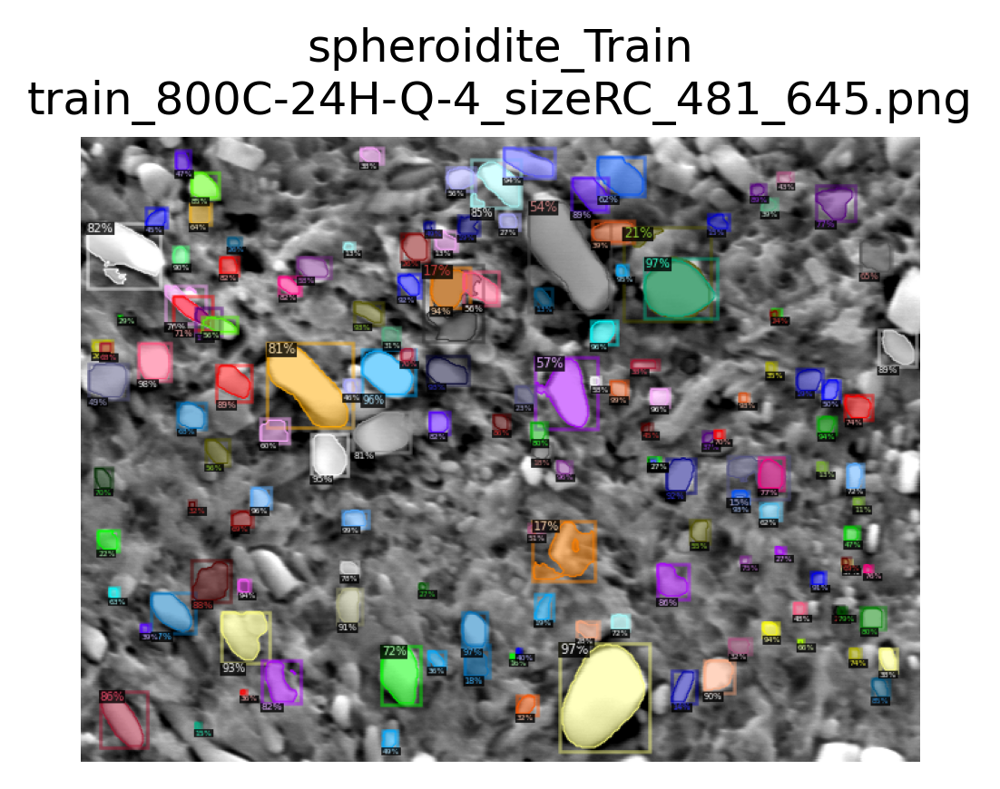

ddict info:
	path: data/images/train_800C-24H-Q-4_sizeRC_481_645.png
	num_instances: 150
	File: data/images/train_800C-8H-Q-4_sizeRC_484_645.png


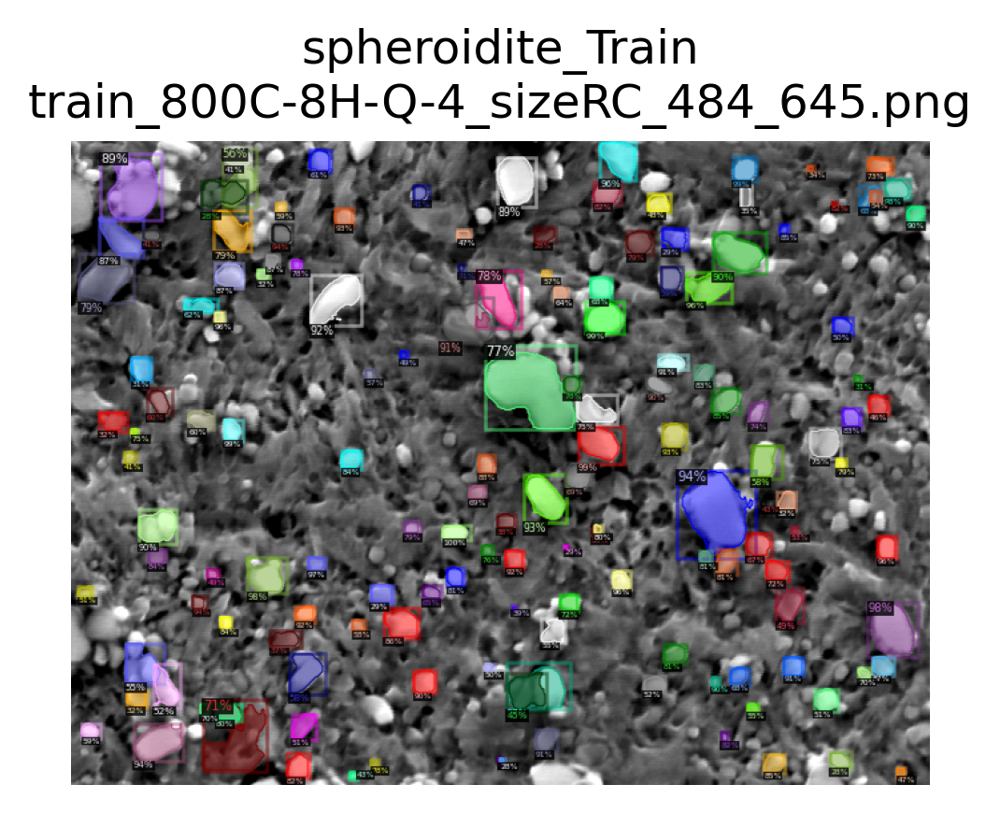

ddict info:
	path: data/images/train_800C-8H-Q-4_sizeRC_484_645.png
	num_instances: 150
	File: data/images/train_800C-85H-Q-3_sizeRC_482_645.png


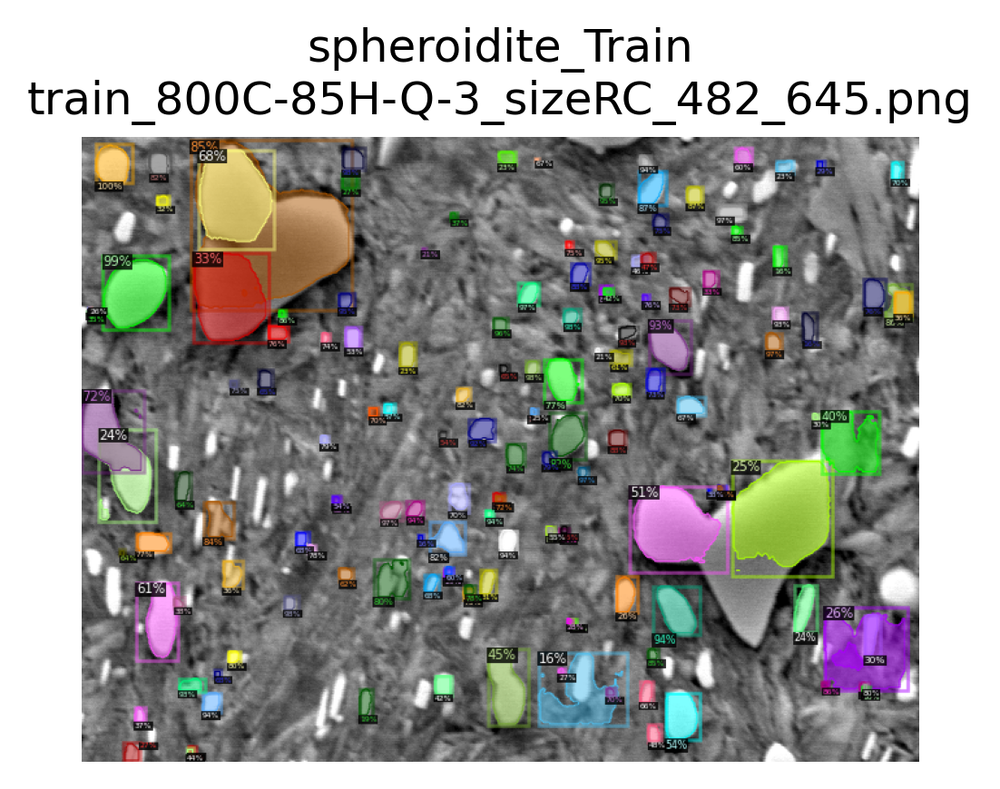

ddict info:
	path: data/images/train_800C-85H-Q-3_sizeRC_482_645.png
	num_instances: 150
	File: data/images/train_800C-85H-Q-1_sizeRC_481_645.png


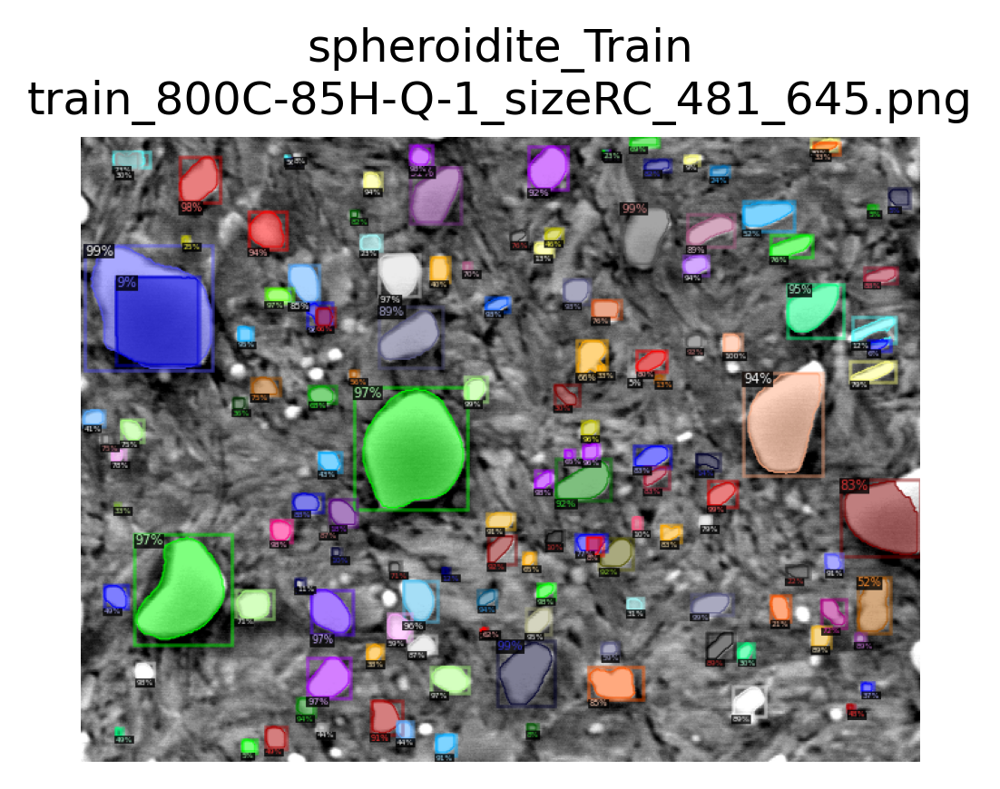

ddict info:
	path: data/images/train_800C-85H-Q-1_sizeRC_481_645.png
	num_instances: 145
	File: data/images/train_800C-85H-Q-5_sizeRC_481_645.png


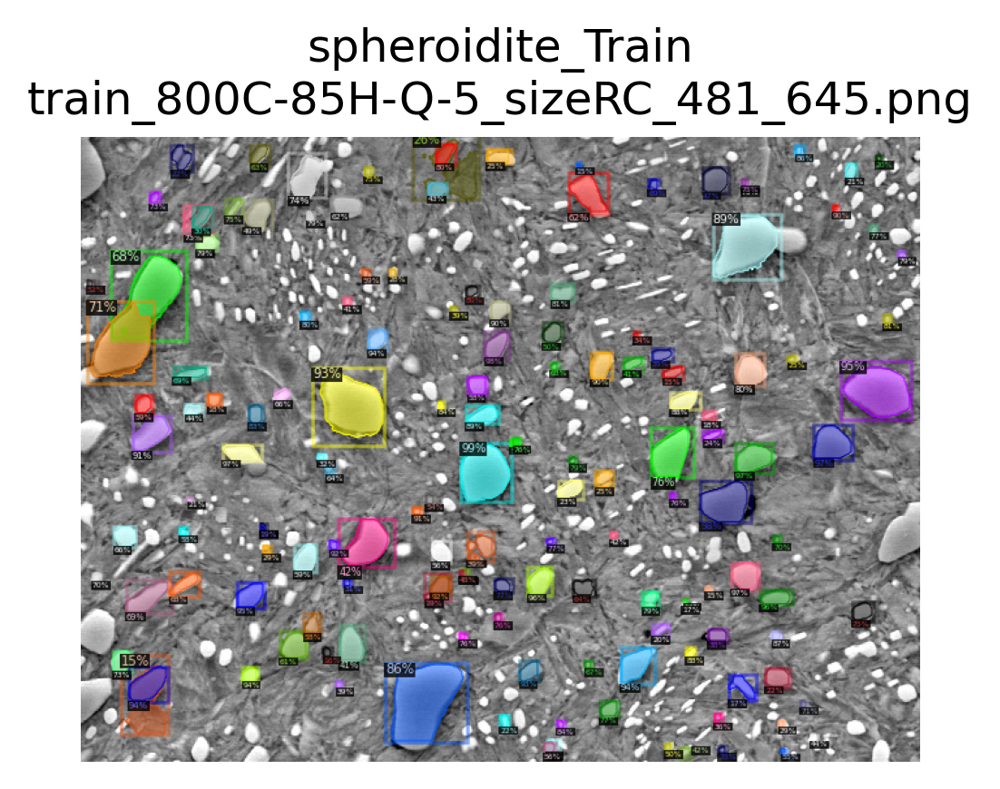

ddict info:
	path: data/images/train_800C-85H-Q-5_sizeRC_481_645.png
	num_instances: 150
	File: data/images/train_800C-24H-Q-2_sizeRC_484_645.png


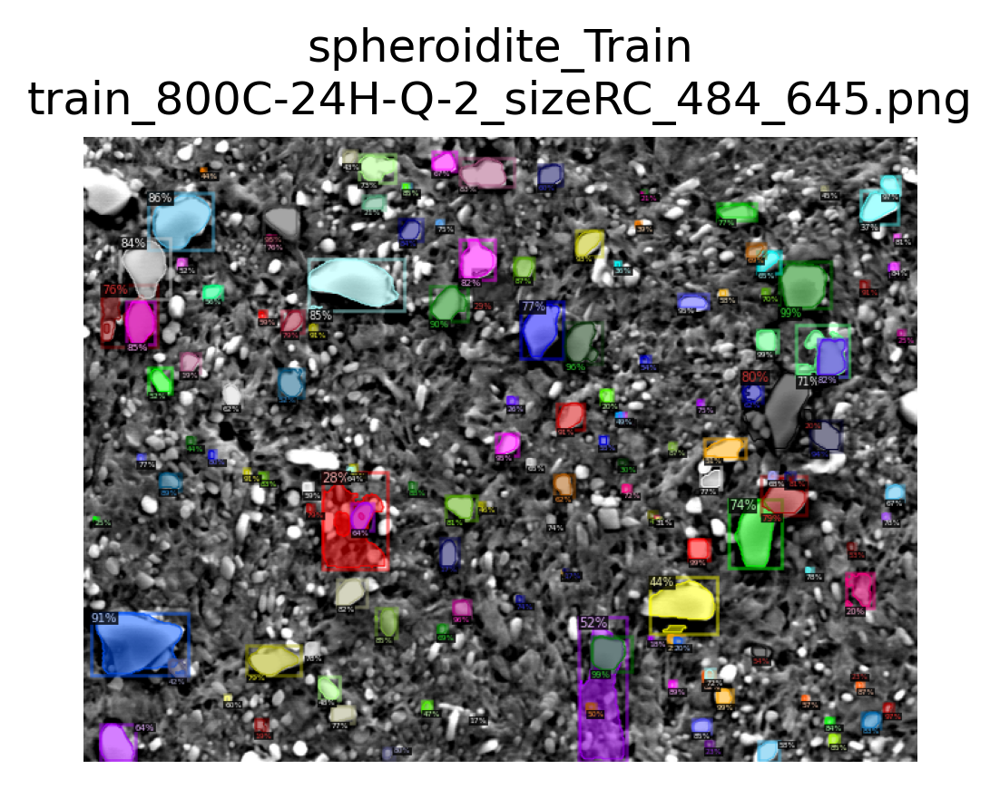

ddict info:
	path: data/images/train_800C-24H-Q-2_sizeRC_484_645.png
	num_instances: 150
	File: data/images/train_800C-24H-Q-6_sizeRC_481_645.png


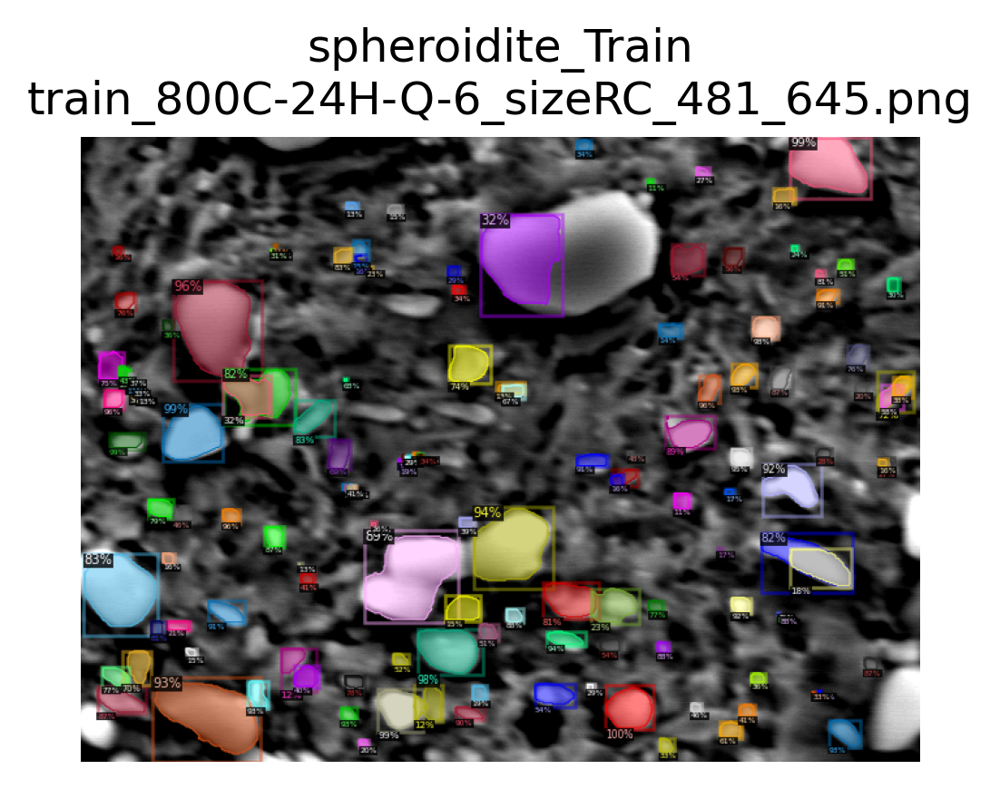

ddict info:
	path: data/images/train_800C-24H-Q-6_sizeRC_481_645.png
	num_instances: 150
Dataset: spheroidite_Val
	File: data/images/valid_800C-85H-Q-2_sizeRC_483_645.png


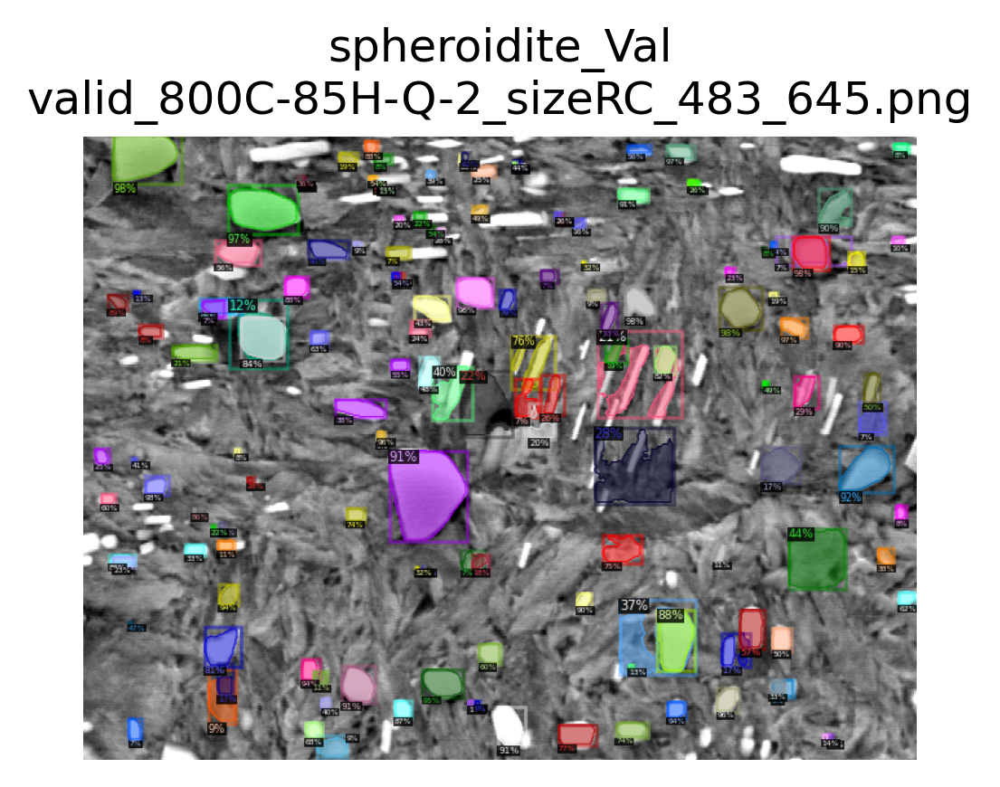

ddict info:
	path: data/images/valid_800C-85H-Q-2_sizeRC_483_645.png
	num_instances: 150
	File: data/images/valid_800C-85H-Q-6_sizeRC_483_645.png


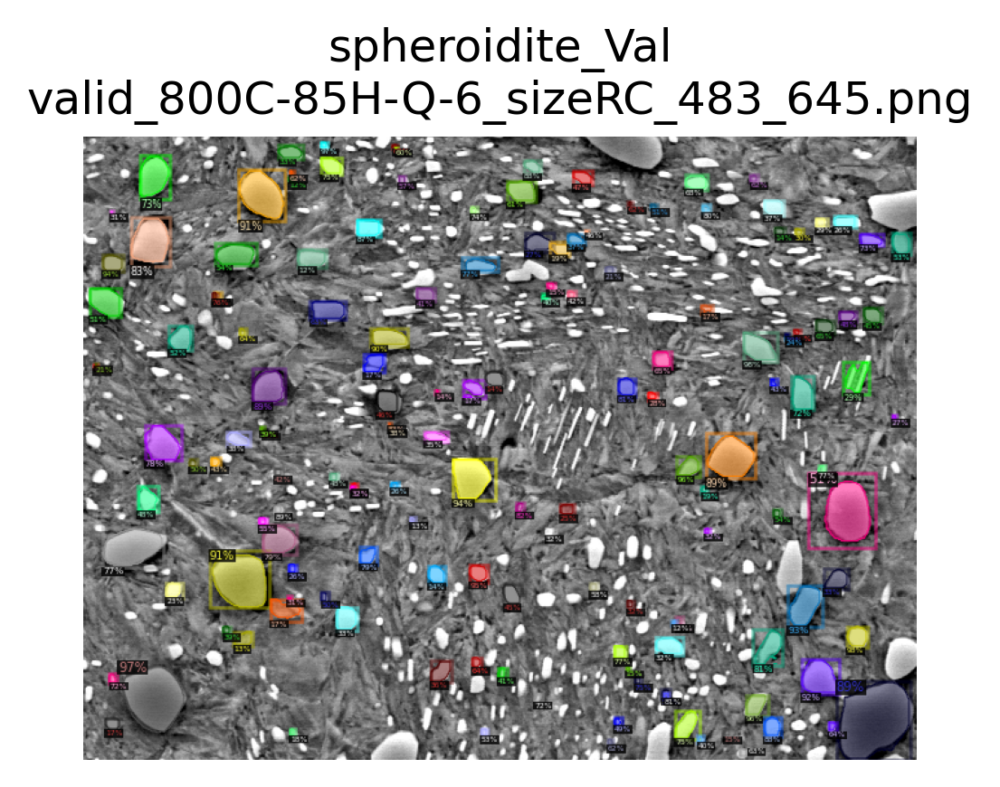

ddict info:
	path: data/images/valid_800C-85H-Q-6_sizeRC_483_645.png
	num_instances: 150


In [9]:
results = []
for ds in cfg.DATASETS.TEST:
    print(f'Dataset: {ds}')
    for dd in DatasetCatalog.get(ds):
        print(f'\tFile: {dd["file_name"]}')
        img = cv2.imread(dd['file_name'])  # load image
        outs = predictor(img)  # run inference on image

        # format outputs for visualization and store for later
        # note that calling format_outputs() modifies predictions in place and allows us to visualize them
        results.append(data_utils.format_outputs(dd['file_name'], ds, outs))

        # visualize results
        visualize.display_ddicts(outs, None, ds, gt=False, img_path=dd['file_name'])

# save to disk
with open(Path('data',f'{EXPERIMENT_NAME}-results.pickle'), 'wb') as f:
    pickle.dump(results, f)